## SEATTLE CAR ACCIDENT SEVERITY CAPSTONE

_Importing relevant libaries__

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn import preprocessing
from scipy import stats
import scipy as sp
import random
import seaborn as sns
from sklearn.metrics import accuracy_score,f1_score,log_loss,classification_report,confusion_matrix,jaccard_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import pydotplus
import matplotlib.image as mpimg
from io import StringIO
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import folium
import webbrowser
from folium import plugins
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [6]:
accident = pd.read_csv('Data-Collisions.csv')

/home/hp/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [7]:
accident.iloc[:,32].dtype

dtype('O')

In [8]:
accident.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,EXCEPTRSNCODE,EXCEPTRSNDESC,SEVERITYCODE.1,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,5TH AVE NE AND NE 103RD ST,,NaN,2,Injury Collision,Angles,2,0,0,2,2013/03/27 00:00:00+00,3/27/2013 2:54:00 PM,At Intersection (intersection related),11,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,N,Overcast,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,NaN,NaN,1,Property Damage Only Collision,Sideswipe,2,0,0,2,2006/12/20 00:00:00+00,12/20/2006 6:55:00 PM,Mid-Block (not related to intersection),16,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",NaN,0,Raining,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,NaN,NaN,1,Property Damage Only Collision,Parked Car,4,0,0,3,2004/11/18 00:00:00+00,11/18/2004 10:20:00 AM,Mid-Block (not related to intersection),14,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",NaN,0,Overcast,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,2ND AVE BETWEEN MARION ST AND MADISON ST,,NaN,1,Property Damage Only Collision,Other,3,0,0,3,2013/03/29 00:00:00+00,3/29/2013 9:26:00 AM,Mid-Block (not related to intersection),11,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,N,Clear,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,SWIFT AVE S AND SWIFT AV OFF RP,NaN,NaN,2,Injury Collision,Angles,2,0,0,2,2004/01/28 00:00:00+00,1/28/2004 8:04:00 AM,At Intersection (intersection related),11,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,0,Raining,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [9]:
accident.shape

(194673, 38)

In [10]:
##Recoding accident severity code from 1,2 to 0,1

severity = accident.SEVERITYCODE.values
label = preprocessing.LabelEncoder()
label.fit([1,2])
severity = label.transform(severity)
accident["SEVERITYCODE"] = severity


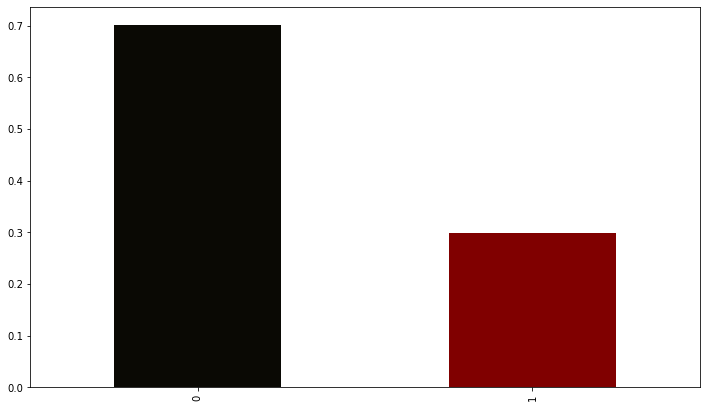

In [145]:
##ploting severity code

accident.SEVERITYCODE.value_counts(normalize=True).plot(kind='bar', figsize=(12,7), color=['#0A0904', '#800000'])


In [12]:
#data is unbalanced and predicts 0(property damage ) more than 1(injury)
#SMOTE from Imblearn libary


In [13]:
addtype=accident['ADDRTYPE'].value_counts()

In [14]:
addtype

Block           126926
Intersection     65070
Alley              751
Name: ADDRTYPE, dtype: int64

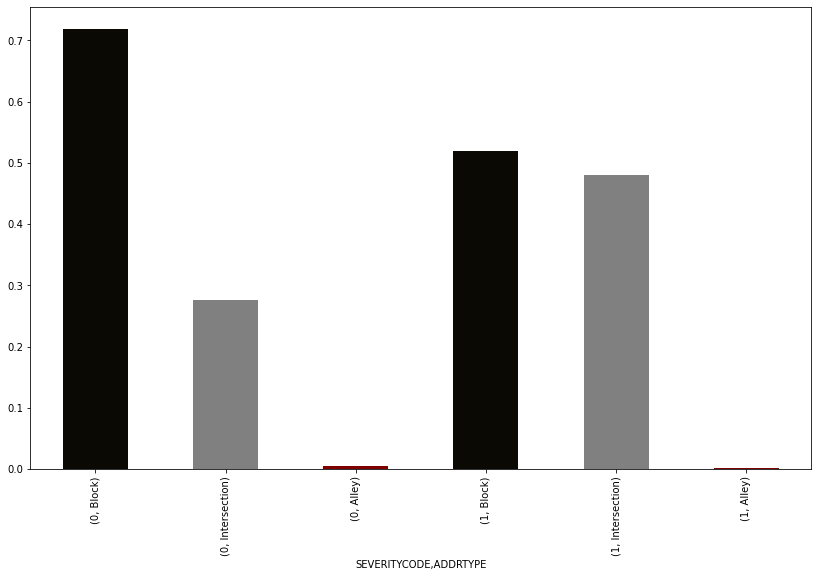

In [15]:
accident.groupby(['SEVERITYCODE']).ADDRTYPE.value_counts(normalize=True).plot.bar(figsize=(14,8.5), color=['#0A0904', '#808080', '#800000'])

In [16]:
grouped = accident.groupby(['SEVERITYCODE'])

In [17]:
grouped.index = ['property damage', 'physical injury']

In [18]:
grouped.describe(include='object')

REPORTNO                        STATUS                          \
                count  unique      top freq   count unique      top    freq   
SEVERITYCODE                                                                  
0              136485  136484  1780512    2  136485      2  Matched  132627   
1               58188   58186  1776526    2   58188      2  Matched   57159   

             ADDRTYPE                      LOCATION         \
                count unique    top   freq    count unique   
SEVERITYCODE                                                 
0              134750      3  Block  96830   134081  22595   
1               57997      3  Block  30096    57915  12486   

                                                                      \
                                                            top freq   
SEVERITYCODE                                                           
0             BATTERY ST TUNNEL NB BETWEEN ALASKAN WY VI NB ...  198   
1                AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST  120   

             EXCEPTRSNCODE                   EXCEPTRSNDESC         \
                     count unique top   freq         count unique   
SEVERITYCODE                                                        
0                    57763      2      52640          5123      1   
1                    27048      2      26533           515      1   

                                                                       \
                                                            top  freq   
SEVERITYCODE                                                            
0             Not Enough Information, or Insufficient Locati...  5123   
1             Not Enough Information, or Insufficient Locati...   515   

             SEVERITYDESC                                                 \
                    count unique                             top    freq   
SEVERITYCODE                                                               
0                  136485      1  Property Damage Only Collision  136485   
1                   58188      1                Injury Collision   58188   

             COLLISIONTYPE                           INCDATE         \
                     count unique         top   freq   count unique   
SEVERITYCODE                                                          
0                   132622     10  Parked Car  45325  136485   5982   
1                    57147     10  Rear Ended  14671   58188   5971   

                                          INCDTTM                          \
                                 top freq   count  unique        top freq   
SEVERITYCODE                                                                
0             2008/10/03 00:00:00+00   68  136485  113970  10/3/2008   67   
1             2006/11/02 00:00:00+00   34   58188   50892  11/2/2006   34   

             JUNCTIONTYPE                                                  \
                    count unique                                      top   
SEVERITYCODE                                                                
0                  130556      7  Mid-Block (not related to intersection)   
1                   57788      7   At Intersection (intersection related)   

                    SDOT_COLDESC         \
               freq        count unique   
SEVERITYCODE                              
0             70396       136485     36   
1             27174        58188     37   

                                                                        \
                                                            top   freq   
SEVERITYCODE                                                             
0             MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...  60871   
1             MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...  24338   

             INATTENTIONIND                   UNDERINFL                    \
                      count unique top   freq     count uniq

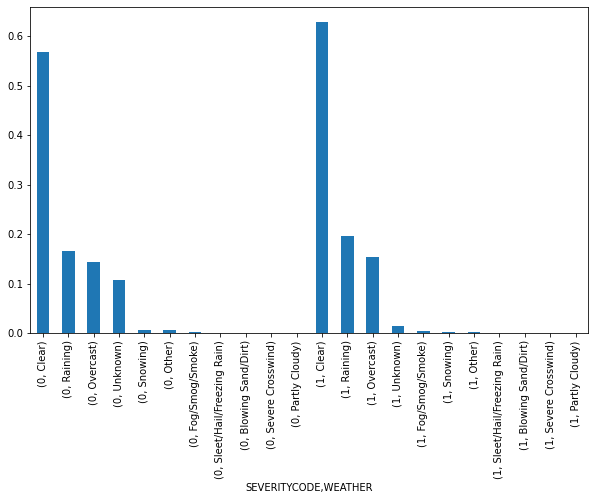

In [19]:
grouped.WEATHER.value_counts(normalize=True).plot.bar(figsize=(10,6))

In [20]:
accident.WEATHER.value_counts()

Clear                       111135
Raining                      33145
Overcast                     27714
Unknown                      15091
Snowing                        907
Other                          832
Fog/Smog/Smoke                 569
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               56
Severe Crosswind                25
Partly Cloudy                    5
Name: WEATHER, dtype: int64

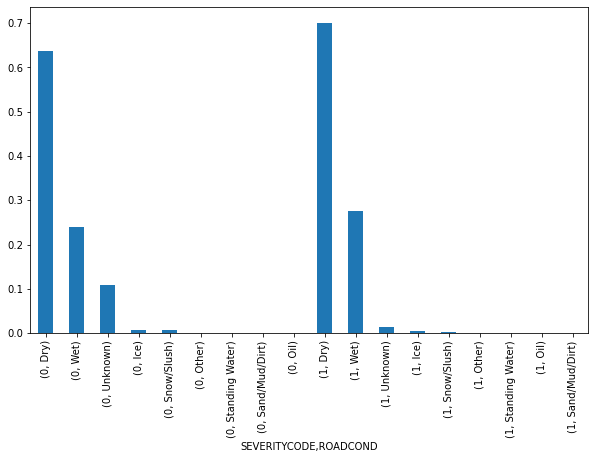

In [21]:
grouped.ROADCOND.value_counts(normalize=True).plot.bar(figsize=(10,6))

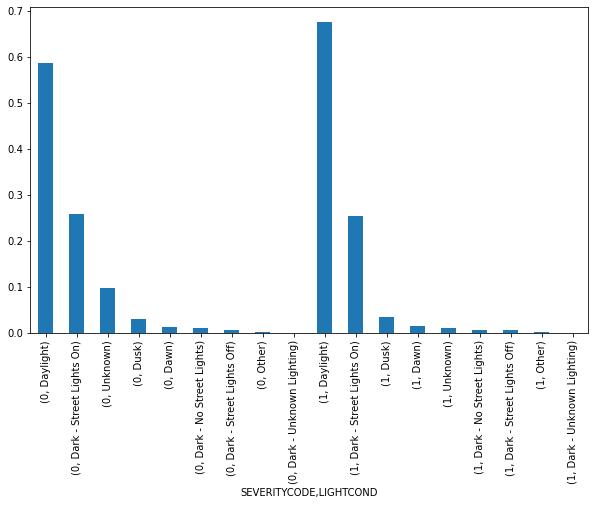

In [22]:
grouped.LIGHTCOND.value_counts(normalize=True).plot.bar(figsize=(10,6))

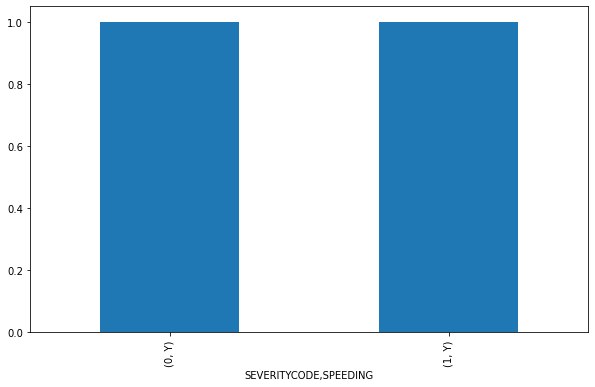

In [23]:
grouped.SPEEDING.value_counts(normalize=True).plot.bar(figsize=(10,6))

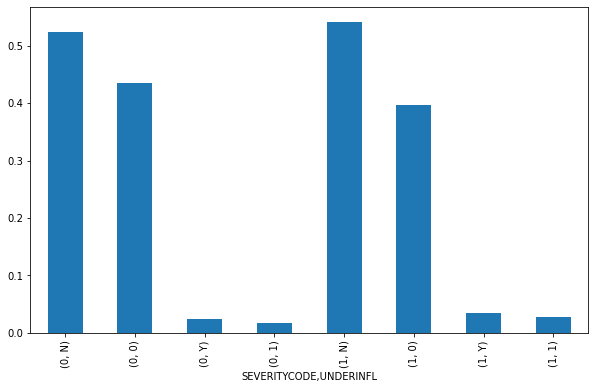

In [24]:
grouped.UNDERINFL.value_counts(normalize=True).plot.bar(figsize=(10,6))

/home/hp/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


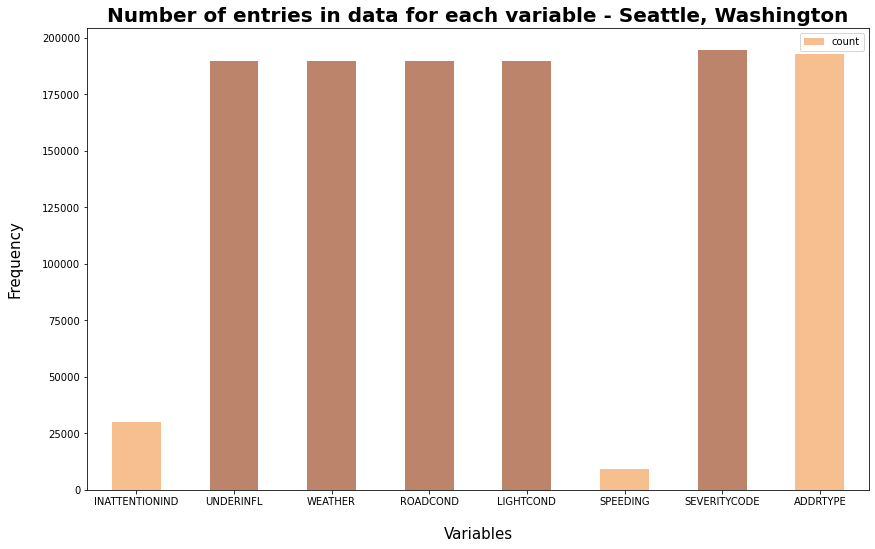

In [25]:
#Descriptive Stats
descriptive_stats= accident.describe(include="all")

    #Plotting counts of selected variables
descriptive_stats_plot=descriptive_stats[["INATTENTIONIND","UNDERINFL","WEATHER","ROADCOND","LIGHTCOND","SPEEDING","SEVERITYCODE", "ADDRTYPE"]]
descriptive_stats_plot.drop(['unique','top','freq','mean','std','min','max','25%','50%','75%'],axis=0,inplace=True)
descriptive_stats_plot=descriptive_stats_plot.transpose()

color_yo=['sandybrown','sienna','sienna','sienna','sienna','sandybrown','sienna']
descriptive_stats_plot.plot(kind='bar',alpha=0.70,color=[color_yo], figsize=(14,8.5))
plt.title('Number of entries in data for each variable - Seattle, Washington', fontsize=20, fontweight='bold')
plt.xlabel("Variables",fontsize=15,labelpad=20)
plt.ylabel("Frequency",fontsize=15,labelpad=20)
plt.xticks(rotation=360)
plt.show()

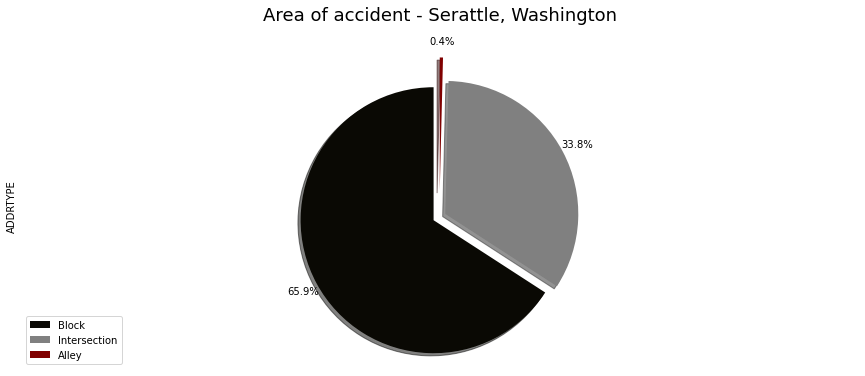

In [26]:
explode_list = [0.05, 0.05, 0.2]
color_=['#0A0904', '#808080', '#800000']
addtype=accident['ADDRTYPE'].value_counts()

addtype.plot(kind='pie',
            figsize=(15, 6),
            autopct='%1.1f%%',
            startangle=90,
            shadow=True,
            labels=None,
            pctdistance=1.12,
            colors=color_,
            explode=explode_list)


plt.title('Area of accident - Serattle, Washington', fontsize=18, y=1.05)
plt.axis('equal')
plt.legend(labels=addtype.index, loc='lower left')

plt.show()


In [27]:
#above the address type has an impact on accident severity.
# recoding to numeric (alley=0, intersection=1, block =2)
accident.ADDRTYPE.replace(to_replace=['Alley', 'Intersection', 'Block'], value=['0','1','2'], inplace=True)

In [28]:
accident['ADDRTYPE']= pd.to_numeric(accident.ADDRTYPE,errors='coerce')

In [29]:
accident.ADDRTYPE.isna().sum()

1926

In [30]:
#Check IncKey unqiue numbers
accident['INCKEY'].nunique()

#Encoding in attention (0 = No, 1 = Yes)
accident["INATTENTIONIND"].replace("Y", 1, inplace=True)
accident["INATTENTIONIND"].replace(np.nan, 0, inplace=True)

#Encoding Under the influence (0 = No, 1 = Yes)
accident["UNDERINFL"].replace("N", 0, inplace=True)
accident["UNDERINFL"].replace("Y", 1, inplace=True)

#Encoding Speeding(0 = No, 1 = Yes)
accident["SPEEDING"].replace("Y", 1, inplace=True)
accident["SPEEDING"].replace(np.nan, 0, inplace=True)

#Encoding Light Conditions(0 = Light, 1 = Medium, 2 = Dark)
accident["LIGHTCOND"].replace("Daylight", 0, inplace=True)
accident["LIGHTCOND"].replace("Dark - Street Lights On", 1, inplace=True)
accident["LIGHTCOND"].replace("Dark - No Street Lights", 2, inplace=True)
accident["LIGHTCOND"].replace("Dusk", 1, inplace=True)
accident["LIGHTCOND"].replace("Dawn", 1, inplace=True)
accident["LIGHTCOND"].replace("Dark - Street Lights Off", 2, inplace=True)
accident["LIGHTCOND"].replace("Dark - Unknown Lighting", 2, inplace=True)
accident["LIGHTCOND"].replace("Other","Unknown", inplace=True)

#Encoding Weather Conditions(0 = Clear, 1 = Overcast and Cloudy, 2 = Windy, 3 = Rain and Snow
accident["WEATHER"].replace("Clear", 0, inplace=True)
accident["WEATHER"].replace("Raining", 3, inplace=True)
accident["WEATHER"].replace("Overcast", 1, inplace=True)
accident["WEATHER"].replace("Other", "Unknown", inplace=True)
accident["WEATHER"].replace("Snowing", 3, inplace=True)
accident["WEATHER"].replace("Fog/Smog/Smoke", 2, inplace=True)
accident["WEATHER"].replace("Sleet/Hail/Freezing Rain", 3, inplace=True)
accident["WEATHER"].replace("Blowing Sand/Dirt", 2, inplace=True)
accident["WEATHER"].replace("Severe Crosswind", 2, inplace=True)
accident["WEATHER"].replace("Partly Cloudy", 1, inplace=True)

#Encoding Road Conditions(0 = Dry, 1 = Mushy, 2 = Wet)
accident["ROADCOND"].replace("Dry", 0, inplace=True)
accident["ROADCOND"].replace("Wet", 2, inplace=True)
accident["ROADCOND"].replace("Ice", 2, inplace=True)
accident["ROADCOND"].replace("Snow/Slush", 1, inplace=True)
accident["ROADCOND"].replace("Other", "Unknown", inplace=True)
accident["ROADCOND"].replace("Standing Water", 2, inplace=True)
accident["ROADCOND"].replace("Sand/Mud/Dirt", 1, inplace=True)
accident["ROADCOND"].replace("Oil", 2, inplace=True)

In [31]:
#Making new dataframe with only variables and unique keys
selected_columns=accident[["X","Y","INCKEY","INATTENTIONIND","UNDERINFL","WEATHER","ROADCOND","LIGHTCOND","SPEEDING","SEVERITYCODE", "ADDRTYPE"]]
feature_df=selected_columns.copy()
feature_df.dropna(axis=0,how='any',inplace=True)
feature_stats=feature_df.describe()

In [32]:
np.count_nonzero(feature_df['UNDERINFL'])

86923

In [33]:
##recoding all the selected features to numeric type

lighting_cond_size = feature_df ["LIGHTCOND"].size

In [34]:
featureinlightcond = feature_df ['LIGHTCOND'] == 'Unknown'

In [35]:
lightcond = feature_df['LIGHTCOND']
lightcond = lightcond.values
lightcond = lightcond[featureinlightcond]


In [36]:
feature_df.shape

(184167, 11)

In [37]:
feature_df.head()

,X,Y,INCKEY,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,SEVERITYCODE,ADDRTYPE
0,-122.323148,47.703140,1307,0.0,0,1,2,0,0.0,1,1.0
1,-122.347294,47.647172,52200,0.0,0,3,2,1,0.0,0,2.0
2,-122.334540,47.607871,26700,0.0,0,1,0,0,0.0,0,2.0
3,-122.334803,47.604803,1144,0.0,0,0,0,0,0.0,0,2.0
4,-122.306426,47.545739,17700,0.0,0,3,2,0,0.0,1,1.0


In [38]:
feature_df.dtypes

X                 float64
Y                 float64
INCKEY              int64
INATTENTIONIND    float64
UNDERINFL          object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
SPEEDING          float64
SEVERITYCODE        int64
ADDRTYPE          float64
dtype: object

In [39]:
## first of all we drop all the colums where the ROAD, weather, Lighting condition are unknown

#feature_df =  feature_df.drop(feature_df[feature_df.ROADCOND ==  'Unknown'].index)

In [40]:
feature_df.shape

(184167, 11)

In [41]:
feature_df =  feature_df.drop(feature_df[feature_df.LIGHTCOND ==  'Unknown'].index)
feature_df =  feature_df.drop(feature_df[feature_df.ROADCOND ==  'Unknown'].index)

feature_df =  feature_df.drop(feature_df[feature_df.WEATHER ==  'Unknown'].index)

In [42]:
feature_df.shape

(166217, 11)

In [43]:
feature_df.head()

,X,Y,INCKEY,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,SEVERITYCODE,ADDRTYPE
0,-122.323148,47.703140,1307,0.0,0,1,2,0,0.0,1,1.0
1,-122.347294,47.647172,52200,0.0,0,3,2,1,0.0,0,2.0
2,-122.334540,47.607871,26700,0.0,0,1,0,0,0.0,0,2.0
3,-122.334803,47.604803,1144,0.0,0,0,0,0,0.0,0,2.0
4,-122.306426,47.545739,17700,0.0,0,3,2,0,0.0,1,1.0


In [44]:
feature_df.shape

(166217, 11)

In [45]:
feature_df.SEVERITYCODE.value_counts()

0    111503
1     54714
Name: SEVERITYCODE, dtype: int64

In [46]:
feature_df.isna().sum()

X                 0
Y                 0
INCKEY            0
INATTENTIONIND    0
UNDERINFL         0
WEATHER           0
ROADCOND          0
LIGHTCOND         0
SPEEDING          0
SEVERITYCODE      0
ADDRTYPE          0
dtype: int64

In [47]:
feature_df["ROADCOND"]=feature_df["ROADCOND"].astype(int)

In [48]:
feature_df["LIGHTCOND"]=feature_df["LIGHTCOND"].astype(int)
feature_df["WEATHER"]=feature_df["WEATHER"].astype(int)
feature_df["UNDERINFL"]=feature_df["UNDERINFL"].astype(int)

feature_df["INATTENTIONIND"]=feature_df["INATTENTIONIND"].astype(int)

feature_df["SPEEDING"]=feature_df["SPEEDING"].astype(int)
feature_df["ADDRTYPE"]=feature_df["ADDRTYPE"].astype(int)



In [49]:
feature_df.dtypes

X                 float64
Y                 float64
INCKEY              int64
INATTENTIONIND      int64
UNDERINFL           int64
WEATHER             int64
ROADCOND            int64
LIGHTCOND           int64
SPEEDING            int64
SEVERITYCODE        int64
ADDRTYPE            int64
dtype: object

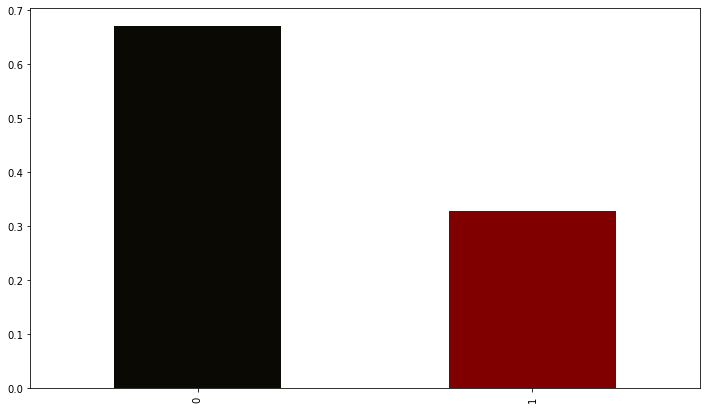

In [50]:
feature_df.SEVERITYCODE.value_counts(normalize=True).plot.bar(color=['#0A0904', '#800000'], figsize=(12,7), label=('Property damage','Injury'))


In [51]:
feature_df.columns.tolist()

['X',
 'Y',
 'INCKEY',
 'INATTENTIONIND',
 'UNDERINFL',
 'WEATHER',
 'ROADCOND',
 'LIGHTCOND',
 'SPEEDING',
 'SEVERITYCODE',
 'ADDRTYPE']

In [52]:
Feature_col = ['INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SPEEDING', 'ADDRTYPE']
X = feature_df[Feature_col].values
X[0:5]

array([[0, 0, 1, 2, 0, 0, 1],
       [0, 0, 3, 2, 1, 0, 2],
       [0, 0, 1, 0, 0, 0, 2],
       [0, 0, 0, 0, 0, 0, 2],
       [0, 0, 3, 2, 0, 0, 1]])

In [53]:
y = feature_df["SEVERITYCODE"].values
y[0:5]

array([1, 0, 0, 0, 1])

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)


Train set: (116351, 7) (116351,)
Test set: (49866, 7) (49866,)


In [66]:
from imblearn.combine import SMOTEENN

In [113]:
os = SMOTE(random_state=0)
os_data_X, os_data_y= os.fit_sample(X_train, y_train)

#Make reduced df from feature_df to get a few random points to make map
limit = 100005
reduced_df = feature_df.iloc [0:limit:5, 0:]


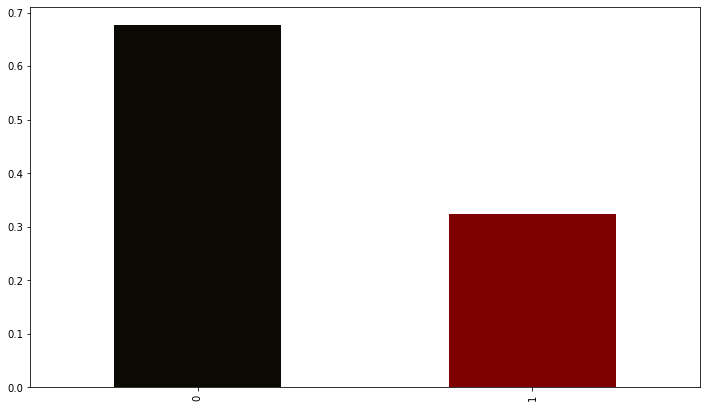

In [114]:
reduced_df.SEVERITYCODE.value_counts(normalize=True).plot.bar(color=['#0A0904', '#800000'], figsize=(12,7), label=('Property damage','Injury'))

In [115]:
seattle_map = folium.Map(location=[47.61536892, -122.3302243], zoom_start=10)


In [116]:
incidents = plugins.MarkerCluster().add_to(seattle_map)

In [117]:
for lat, lng, label, in zip(reduced_df.Y, reduced_df.X, reduced_df.SEVERITYCODE):
    folium.Marker(
    location=[lat, lng],
    icon=None,
    popup=label,
    ).add_to(incidents)

seattle_map.add_child(incidents)

In [118]:
seattle_map
seattle_map.save("seattlemap.html")
#webbrowser.open("seattlemap.html")

## CLassification Models
## Logistic regression model

In [119]:
lr = LogisticRegression(C=0.01, solver='liblinear').fit(os_data_X,os_data_y)
lr

LogisticRegression(C=0.01, solver='liblinear')

In [120]:
lr_predicted = lr.predict(X_test)
lr_probs = lr.predict_proba(X_test)

In [121]:
print(log_loss(y_test, lr_probs))

0.6710148411223572


In [122]:
cnf_matrix = metrics.confusion_matrix(y_test, lr_predicted)
cnf_matrix

array([[22142, 11332],
       [ 7778,  8614]])

Text(0.5, 320.8, 'Predicted label')

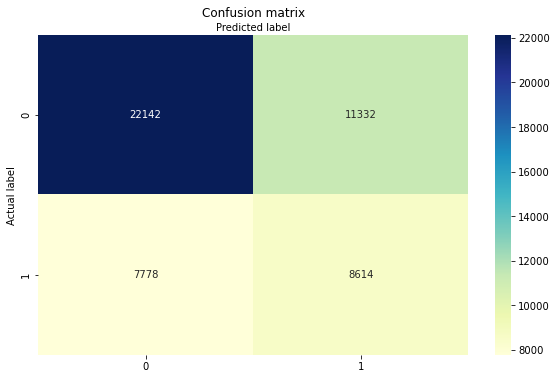

In [123]:

class_names =  [0, 1]

fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [124]:
print("Accuracy:",metrics.accuracy_score(y_test, lr_predicted))
print("Precision:",metrics.precision_score(y_test, lr_predicted))
print("Recall:",metrics.recall_score(y_test, lr_predicted))

Accuracy: 0.616772951510047
Precision: 0.43186603830341924
Recall: 0.5255002440214739


In [125]:
print(classification_report(lr_predicted,y_test))

              precision    recall  f1-score   support

           0       0.66      0.74      0.70     29920
           1       0.53      0.43      0.47     19946

    accuracy                           0.62     49866
   macro avg       0.59      0.59      0.59     49866
weighted avg       0.61      0.62      0.61     49866



In [126]:
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss

In [127]:
print("LR F1-score: %.2f" % f1_score(y_test, lr_predicted, average='weighted') )


LR F1-score: 0.62


In [128]:
plt.rc('figure', figsize=(8, 5))

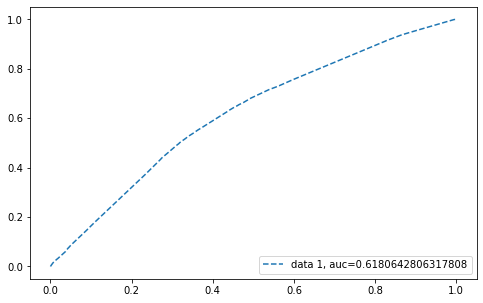

In [152]:

fpr, tpr, _ = metrics.roc_curve(y_test,  lr_probs[::,1])
auc = metrics.roc_auc_score(y_test, lr_probs[::,1])
plt.plot(fpr,tpr,label="data 1, auc="+str(auc), linestyle='--')
plt.legend(loc=4)
plt.show()


# K-nearest neighbor model

In [130]:
#Ks=8
#mean_acc=np.zeros((Ks-1))
#std_acc=np.zeros((Ks-1))
#ConfustionMx=[];
#for n in range(1,Ks):
    
    #Train Model and Predict  
    #kNN_model = KNeighborsClassifier(n_neighbors=n).fit(os_data_X,os_data_y)
    #yhat = kNN_model.predict(X_test)
    
    
    #mean_acc[n-1]=np.mean(yhat==y_test);
    
    #std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
#mean_acc


In [131]:
#plt.plot(np.arange(1,Ks), mean_acc)

In [132]:
kNN_model = KNeighborsClassifier(n_neighbors=4).fit(os_data_X,os_data_y)
kn_predicted = kNN_model.predict(X_test)

Text(0.5, 257.44, 'Predicted label')

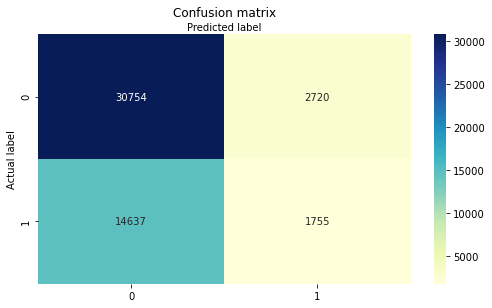

In [133]:
cnf_matrix = metrics.confusion_matrix(y_test, kn_predicted)
cnf_matrix

plt.rc('figure', figsize=(7, 4))
class_names =  [0, 1]

fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [134]:
print(classification_report(kn_predicted,y_test))

              precision    recall  f1-score   support

           0       0.92      0.68      0.78     45391
           1       0.11      0.39      0.17      4475

    accuracy                           0.65     49866
   macro avg       0.51      0.53      0.47     49866
weighted avg       0.85      0.65      0.73     49866



In [135]:
print("Accuracy:",metrics.accuracy_score(y_test, kn_predicted))
print("Precision:",metrics.precision_score(y_test, kn_predicted))
print("Recall:",metrics.recall_score(y_test, kn_predicted))

Accuracy: 0.6519271648016685
Precision: 0.39217877094972065
Recall: 0.10706442166910689


In [136]:
print("Accuracy:",metrics.accuracy_score(y_test, kn_predicted))

Accuracy: 0.6519271648016685


In [137]:
print("KNN F1-score: %.2f" % f1_score(y_test, kn_predicted, average='weighted') )


KNN F1-score: 0.58


# Decision tree model

In [138]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
DT_model.fit(os_data_X,os_data_y)
DT_model


DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [139]:
dt_predicted = DT_model.predict(X_test)

Text(0.5, 320.8, 'Predicted label')

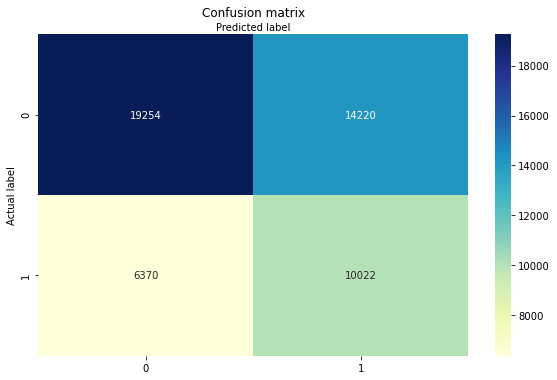

In [140]:
cnf_matrix = metrics.confusion_matrix(y_test, dt_predicted)
cnf_matrix

plt.rc('figure', figsize=(8, 5))
class_names =  [0, 1]

fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [141]:
print("Accuracy:",metrics.accuracy_score(y_test, dt_predicted))

Accuracy: 0.5870934103397104


In [142]:
print(classification_report(dt_predicted,y_test))

              precision    recall  f1-score   support

           0       0.58      0.75      0.65     25624
           1       0.61      0.41      0.49     24242

    accuracy                           0.59     49866
   macro avg       0.59      0.58      0.57     49866
weighted avg       0.59      0.59      0.57     49866



In [143]:
print("Accuracy:",metrics.accuracy_score(y_test, dt_predicted))
print("Precision:",metrics.precision_score(y_test, dt_predicted))
print("Recall:",metrics.recall_score(y_test, dt_predicted))

Accuracy: 0.5870934103397104
Precision: 0.4134147347578583
Recall: 0.6113958028306491


In [144]:
print("DT F1-score: %.2f" % f1_score(y_test, dt_predicted, average='weighted') )

DT F1-score: 0.60
